# Introduction into Data Science - Assignment Part II

This is the second part of the assignment in IDS 2023/2024.

This part of the assignment consists of five questions — each of these questions is contained in a separate Jupyter notebook:
- [Question 1: Data Preprocessing](Q1_Preprocessing_Visualization.ipynb)
- [Question 2: Association Rules](Q2_Frequent_Itemsets_Association_Rules.ipynb)
- [Question 3: Process Mining](Q3_Process_Mining.ipynb)
- [Question 4: Text Mining](Q4_Text_Mining.ipynb)
- [Question 5: Big Data](Q5_Big_Data.ipynb)

Additional required files are in two folders.
- [datasets](datasets/)
- [scripts](scripts/)

Please use the provided notebook to work on the questions. When you are done, upload your version of each of the notebooks to Moodle. Your submission will, therefore, consist of five jupyter notebook and _no_ additional file. Any additionally provided files will not be considered in grading.
Enter your commented Python code and answers in the corresponding cells. Make sure to answer all questions in a clear and explicit manner and discuss your outputs. _Please do not change the general structure of this notebook_. You can, however, add additional markdown or code cells if necessary. Please **DO NOT CLEAR THE OUTPUT** of the notebook you are submitting! Additionally, please ensure that the code in the notebook runs if placed in the same folder as all of the provided files, delivering the same outputs as the ones you submit in the notebook. This includes being runnable in the bundled conda environment.

*Please make sure to include the names and matriculation numbers of all group members in the provided slots in each of the notebooks.* If a name or a student id is missing, the student will not receive any points.

Hint 1: **Plan your time wisely.** A few parts of this assignment may take some time to run. It might be necessary to consider time management when you plan your group work. Also, do not attempt to upload your assignment at the last minute before the deadline. This often does not work, and you will miss the deadline. Late submissions will not be considered.

Hint 2: RWTHMoodle allows multiple submissions, with every new submission overwriting the previous one. **Partial submissions are possible and encouraged.** This might be helpful in case of technical issues with RWTHMoodle, which may occur close to the deadline.

Hint 3: As a technical note. Some IDEs such as DataSpell may automatically strip jupyter notebook cell metadata. If you are able, please re-add it from the source notebooks before submission. This is necessary for our grading.

Enter your group number and members with matriculation numbers below.

1.)Danqi Zhao 441469

2.)Xingjian Tian 436949

3.)Jiaming zhang 444572

In [307]:
GROUP_NO = 66 # group number
GROUP_MEMBERS = {
    441469: "Danqi Zhao", # mat. no. : name,
    436949: "Xingjian Tian",
    444572: "Jiaming zhang",
}

---

In [308]:
# required imports
# please do not edit!
import pandas as pd
import pm4py
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display

# Process Mining (23 points)
Your "Introduction into Data Science" course at the PADS chair has made you curious about Process Mining. 
You decide that you want to get a deeper understanding of the learned concepts. To do so, you use PM4Py - the documentation of this library can be found at: [PM4Py documentation](https://pm4py.fit.fraunhofer.de/static/assets/api/2.7.5/api.html)

## Part I: Implementation of Core Concepts (8 points)

You find an event log describing how the individual groups of the second part of the IDS Assignment two years ago approached the tasks, as a CSV file called **event_log_pt1.csv**. 
Your friend points out that this seems like an ideal log to implement the things you learned in lecture on an easy-to-understand log.

#### a)
You begin by loading the event log into a variable called `log_groups`. 
The event log should be imported as a pandas dataframe which is a PM4Py suitable data format and compute the following variables:
* `case_count`: How many groups took Part II of the assignment in Wintersemester 2021/2022?
* `activity_count`: How many unique activities were logged? 



In [309]:
# YOUR CODE HERE
# import
log_groups = pd.read_csv('datasets/q3_event_log_pt1.csv', sep=',')
# format timestamp
log_groups['Timestamp'] = pd.to_datetime(log_groups['Timestamp'])
display(log_groups.head())

# use pm4py's reformatting help. It transforms the event log into the dataframe format.
log_groups = pm4py.format_dataframe(log_groups, case_id='Group Number', activity_key='Activity', timestamp_key='Timestamp', timest_format="yyyy-mm-dd hh:mm:ss")

display(log_groups.head())
# case_count
case_count = log_groups['case:concept:name'].nunique()
# activity_count
activity_count = log_groups['concept:name'].nunique()

print(case_count, "groups took Part II of the assignment in WS 2021/2022.")
print(activity_count,"unique activities were logged.")


,Group Number,Activity,Timestamp
0,4,First download of assignment,2021-12-09 07:30:00+00:00
1,4,Revisit PM Exercise in Moodle,2021-12-09 14:02:00+00:00
2,4,Coordinate with Assignment Group,2021-12-09 14:23:00+00:00
3,4,Solve tasks together,2021-12-09 14:56:00+00:00
4,4,Recheck/Compare Task Results,2021-12-09 15:05:00+00:00


,Group Number,Activity,Timestamp,case:concept:name,concept:name,time:timestamp,@@index,@@case_index
0,1,First download of assignment,2021-12-09 07:30:00+00:00,1,First download of assignment,2021-12-09 07:30:00+00:00,0,0
1,1,Revisit PM Exercise in Moodle,2021-12-09 14:55:00+00:00,1,Revisit PM Exercise in Moodle,2021-12-09 14:55:00+00:00,1,0
2,1,Solve tasks individually,2021-12-09 15:22:00+00:00,1,Solve tasks individually,2021-12-09 15:22:00+00:00,2,0
3,1,Recheck/Compare Task Results,2021-12-09 15:28:00+00:00,1,Recheck/Compare Task Results,2021-12-09 15:28:00+00:00,3,0
4,1,Redo Task(s),2021-12-09 15:34:00+00:00,1,Redo Task(s),2021-12-09 15:34:00+00:00,4,0


516 groups took Part II of the assignment in WS 2021/2022.
8 unique activities were logged.


Given the low number of activities, you decide to plot the directly-follows graph and manually detect the first cut the Inductive Miner would apply.

#### b)
Use PM4Py to create the directly follows graph, using `dfg` as variable name for the graph structure, `start_act` as variable name for the start activities, and `end_act` for the final activities. Show the directly-follows graph.


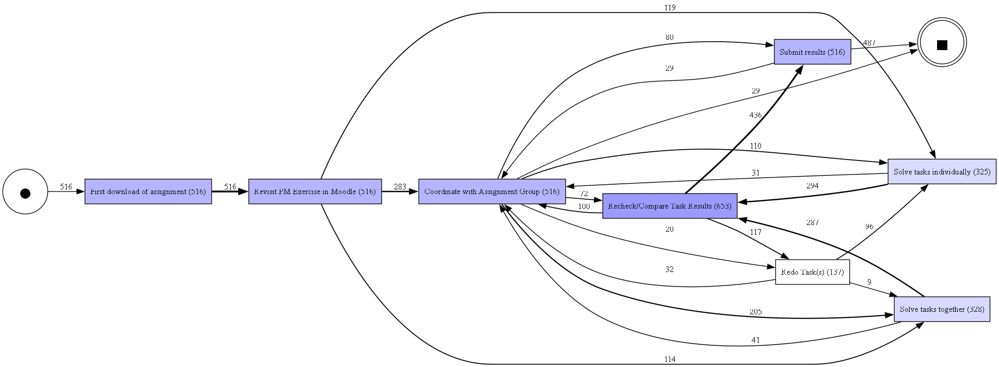

In [310]:
# YOUR CODE HERE
dfg, start_act, end_act = pm4py.discover_directly_follows_graph(log_groups)
pm4py.view_dfg(dfg=dfg, start_activities=start_act, end_activities=end_act)

#### c)
Based on the DFG, name the first type of cut that is identified by the Inductive Miner. Briefly explain why this is the correct cut.

*Hint: You can of course also use other functionalities of PM4Py to identify the cut. Nevertheless, your submitted notebook is expected to contain the DFG.*


__Student Answer:__ Sequence cut. Every trace from the start to the end, must go through 2 activites , which are “First download of assignment” and “Revisit PM Exercise in Moodle”. So we can make the sequence cut firstly and separate these 2 activities from the rest.

#### d)
Give the activity-partitions as a list and store it into a variable called `first_cut_partitions`. This list should include at least two sets containing only activity names (no start or end).
Note, that the number of partitions depends on the maximum cut you identified.

For example, `[{"c","d"}, {"a","b"}]` indicates two partitions: one with a and b and the other with c and d.

In [311]:
# YOUR CODE HERE
first_cut_partitions = [{"First download of assignment","Revisit PM Exercise in Moodle"}, {"Solve tasks individually","Coordinate with Assignment Group","Solve tasks together","Recheck/Compare Task Results","Redo Task(s)","Submit results"}]

#### e)
Having identified the cut, split the event log accordingly. 
Create five variables, called `sub_log_groups1`, `sub_log_groups2`, `sub_log_groups3`, `sub_log_groups4`, and `sub_log_groups5`. 
Create the sublog for each of your identified partitions and store it in one of the variables. Assign `None` to all variables you don't use.

In [135]:
sub_log_groups1 = ... # either sublog (aka dataframe) or None
sub_log_groups2 = ... # either sublog (aka dataframe) or None
sub_log_groups3 = ... # either sublog (aka dataframe) or None
sub_log_groups4 = ... # either sublog (aka dataframe) or None
sub_log_groups5 = ... # either sublog (aka dataframe) or None
# YOUR CODE HERE
matche1 = ['First download of assignment', 'Revisit PM Exercise in Moodle']
matche2 = ['Coordinate with Assignment Group','Submit results']
matche3 = ['Redo Task(s)']
matche4 = ['Recheck/Compare Task Results']
matche5 = ['Solve tasks individually', 'Solve tasks together']

sub_log_groups1 = log_groups[log_groups['concept:name'].str.contains('|'.join(matche1))]
sub_log_groups2 = log_groups[log_groups['concept:name'].str.contains('|'.join(matche2))]
sub_log_groups3 = log_groups[log_groups['concept:name'].str.contains('|'.join(matche3))]
sub_log_groups4 = log_groups[log_groups['concept:name'].str.contains('|'.join(matche4))]
sub_log_groups5 = log_groups[log_groups['concept:name'].str.contains('|'.join(matche5))]
#example display sub_log_groups5
display(sub_log_groups5)

C:\Users\a0686\AppData\Local\Temp\ipykernel_298400\541761964.py:15: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  sub_log_groups3 = log_groups[log_groups['concept:name'].str.contains('|'.join(matche3))]


,Group Number,Activity,Timestamp,case:concept:name,concept:name,time:timestamp,@@index,@@case_index,start_timestamp
2,1,Solve tasks individually,2021-12-09 15:22:00+00:00,1,Solve tasks individually,2021-12-09 15:22:00+00:00,2,0,2021-12-09 15:22:00+00:00
6,1,Solve tasks individually,2021-12-09 15:43:00+00:00,1,Solve tasks individually,2021-12-09 15:43:00+00:00,6,0,2021-12-09 15:43:00+00:00
12,100,Solve tasks together,2021-12-22 14:00:00+00:00,100,Solve tasks together,2021-12-22 14:00:00+00:00,12,1,2021-12-22 14:00:00+00:00
18,102,Solve tasks individually,2021-12-22 14:09:00+00:00,102,Solve tasks individually,2021-12-22 14:09:00+00:00,18,2,2021-12-22 14:09:00+00:00
23,103,Solve tasks together,2021-12-22 14:59:00+00:00,103,Solve tasks together,2021-12-22 14:59:00+00:00,23,3,2021-12-22 14:59:00+00:00
29,104,Solve tasks together,2021-12-22 15:45:00+00:00,104,Solve tasks together,2021-12-22 15:45:00+00:00,29,4,2021-12-22 15:45:00+00:00
36,105,Solve tasks together,2021-12-22 13:20:00+00:00,105,Solve tasks together,2021-12-22 13:20:00+00:00,36,5,2021-12-22 13:20:00+00:00
41,106,Solve tasks individually,2021-12-23 08:12:00+00:00,106,Solve tasks individually,2021-12-23 08:12:00+00:00,41,6,2021-12-23 08:12:00+00:00
45,106,Solve tasks individually,2021-12-23 08:33:00+00:00,106,Solve tasks individually,2021-12-23 08:33:00+00:00,45,6,2021-12-23 08:33:00+00:00
51,107,Solve tasks individually,2021-12-23 08:06:00+00:00,107,Solve tasks individually,2021-12-23 08:06:00+00:00,51,7,2021-12-23 08:06:00+00:00


In [61]:
# Please leave this cell empty - used for grading.

 ## Part II: Generating Process Insights (16 Points)  
After having applied some of the learned process mining techniques to a proper event log, you notice that you enjoy working with event data and feel a lot more confident with your skills. 
For this reason, you decide to found a student association to offer students the opportunity to gain experience in Process Mining by executing projects with non-profit organisations and communal services. 
Your first project is with the municipality to evaluate how they deal with filed requests from citizens.

#### a)
Load the municipality's fully anonymized event log **q3_event_log_pt2.xes** into a variable called `sa_log` using PM4Py and display the first 20 rows of the dataframe. 
Create and display the following statistics and save them in the corresponding variable names:  
* `sa_event_count` The number of events in the log.  
* `sa_case_count`: The number of cases in the log.

In [312]:
# YOUR CODE HERE
sa_log = pm4py.read_xes('datasets/q3_event_log_pt2.xes')
display(sa_log.head(20))
sa_event_count = len(sa_log)
sa_case_count = len(sa_log["case:concept:name"].unique())
print("sa_event_count:", sa_event_count)
print("sa_case_count:", sa_case_count)

parsing log, completed traces ::   0%|          | 0/4580 [00:00<?, ?it/s]

,service_type,workgroup,citizen_no,service_level,concept:name,service,responsible_department,time:timestamp,lifecycle:transition,case:concept:name
0,Service Type 1,Group 1,0052211,Level 1,Assign priority,Service 1,Department 1,2012-10-09 12:50:17+00:00,complete,Case 1
1,Service Type 1,Group 1,0052211,Level 1,Begin resolving,Service 1,Department 1,2012-10-09 12:51:01+00:00,complete,Case 1
2,Service Type 1,Group 1,0052211,Level 2,Begin resolving,Service 1,Department 1,2012-10-12 13:02:56+00:00,complete,Case 1
3,Service Type 1,Group 1,0052211,Level 2,Notify citizen about resolution,Service 1,Department 1,2012-10-25 09:54:26+00:00,complete,Case 1
4,Service Type 1,Group 1,0052211,Level 2,Archive request,Service 1,Department 1,2012-11-09 11:54:39+00:00,complete,Case 1
5,Service Type 1,Group 3,00522110,Level 3,Assign priority,Service 3,Department 2,2010-02-10 07:50:20+00:00,complete,Case 10
6,Service Type 1,Group 3,00522110,Level 3,Begin resolving,Service 3,Department 2,2010-03-19 07:47:06+00:00,complete,Case 10
7,Service Type 1,Group 3,00522110,Level 3,Notify citizen about resolution,Service 3,Department 2,2010-03-19 07:47:13+00:00,complete,Case 10
8,Service Type 1,Group 3,00522110,Level 3,Archive request,Service 3,Department 2,2010-04-03 05:47:38+00:00,complete,Case 10
9,Service Type 1,Group 1,00522144,Level 2,Assign priority,Service 1,Department 1,2013-04-12 08:25:17+00:00,complete,Case 100


sa_event_count: 21348
sa_case_count: 4580


#### b)
First, look at the individual variants in the log. 
Create an overview of trace variants in the event log as a dictionary called `sa_variants`. 
Each entry should contain the following: 
* Key: A tuple of activity names representing the trace variant,
* Value: The number of occurrences of this variant in the log. 

Additionally, answer the following questions and indicate their answers in the variables as described below:
* `start_activities`: What is the set of start activity names found in the log?
* `end_activities`: What is the set of end activity names found in the log?
* `sa_variant_count`: How many trace variants does the event log contain?

In [17]:
# YOUR CODE HERE
sa_variants = pm4py.get_variants_as_tuples(sa_log) 
print(sa_variants)

{('Assign priority', 'Begin resolving', 'Begin resolving', 'Notify citizen about resolution', 'Archive request'): 36, ('Assign priority', 'Begin resolving', 'Notify citizen about resolution', 'Archive request'): 2366, ('Assign priority', 'Begin resolving', 'Escalate', 'Notify citizen about resolution', 'Archive request'): 40, ('Assign priority', 'Assign priority', 'Begin resolving', 'Notify citizen about resolution', 'Archive request'): 213, ('Assign priority', 'Begin resolving', 'Inquire further information form other municipality', 'Notify citizen about resolution', 'Archive request'): 552, ('Insert request', 'Assign priority', 'Begin resolving', 'Notify citizen about resolution', 'Archive request'): 69, ('Assign priority', 'Notify citizen about resolution', 'Archive request'): 164, ('Assign priority', 'Begin resolving', 'Inquire further information form other municipality', 'Begin resolving', 'Notify citizen about resolution', 'Archive request'): 228, ('Assign priority', 'Begin reso

In [313]:
# YOUR CODE HERE
start_activities = pm4py.get_start_activities(sa_log)
print("start_activities:",start_activities)

end_activities = pm4py.get_end_activities(sa_log)
print("end_activities:",end_activities)

sa_variant_count = len(sa_variants)
print("sa_variant_count:",sa_variant_count)

start_activities: {'Assign priority': 4384, 'Insert request': 118, 'Begin resolving': 74, 'Notify citizen about resolution': 2, 'Begin anomaly investigation of provided data': 1, 'Inquire further information form other municipality': 1}
end_activities: {'Archive request': 4557, 'Inquire further information form other municipality': 8, 'Verify provided data': 1, 'Escalate': 3, 'Begin resolving': 1, 'Notify citizen about resolution': 10}
sa_variant_count: 226


#### d)
You notice that more than half of the activities in the log are either start or end activities and take this as an indicator for noisy data.
Create a new filtered event log `log_archived_frequent`, which only contains variants containing at least 2% of cases in log and in which the request and resolution are archived. 
How many variants does this log contain? Display your answer and store it in `variants_archived_frequent_count`. How many cases does this sub-log contain (`cases_archived_frequent_count`)? 

In [314]:
# YOUR CODE HERE
display(sa_log.shape)
log_archived_frequent = pm4py.filter_activities_rework(sa_log, 'Archive request', 1, activity_key='concept:name', timestamp_key='time:timestamp', case_id_key='case:concept:name')
#log_archived_frequent = pm4py.filter_end_activities(sa_log, ["Archive request"])
display(log_archived_frequent.shape)
log_archived_frequent = pm4py.filter_variants_by_coverage_percentage(log_archived_frequent, 0.02)
display(log_archived_frequent.shape)
#pd.options.display.max_columns = None
#pd.options.display.max_rows = None
variants_archived_frequent_count = len(pm4py.get_variants_as_tuples(log_archived_frequent))
cases_archived_frequent_count = log_archived_frequent['case:concept:name'].nunique()
print('This log contains',variants_archived_frequent_count,'variants.')
print('This sub-log contains',cases_archived_frequent_count,'cases.')
display(log_archived_frequent)

(21348, 10)

(21246, 10)

(15694, 10)

This log contains 6 variants.
This sub-log contains 3632 cases.


,service_type,workgroup,citizen_no,service_level,concept:name,service,responsible_department,time:timestamp,lifecycle:transition,case:concept:name
5,Service Type 1,Group 3,00522110,Level 3,Assign priority,Service 3,Department 2,2010-02-10 07:50:20+00:00,complete,Case 10
6,Service Type 1,Group 3,00522110,Level 3,Begin resolving,Service 3,Department 2,2010-03-19 07:47:06+00:00,complete,Case 10
7,Service Type 1,Group 3,00522110,Level 3,Notify citizen about resolution,Service 3,Department 2,2010-03-19 07:47:13+00:00,complete,Case 10
8,Service Type 1,Group 3,00522110,Level 3,Archive request,Service 3,Department 2,2010-04-03 05:47:38+00:00,complete,Case 10
14,Service Type 1,Group 1,00522192,Level 2,Assign priority,Service 3,Department 4,2010-01-21 07:53:28+00:00,complete,Case 1000
15,Service Type 1,Group 1,00522192,Level 2,Assign priority,Service 3,Department 4,2010-01-21 07:53:34+00:00,complete,Case 1000
16,Service Type 1,Group 1,00522192,Level 2,Begin resolving,Service 3,Department 4,2010-01-21 07:53:40+00:00,complete,Case 1000
17,Service Type 1,Group 1,00522192,Level 2,Notify citizen about resolution,Service 3,Department 4,2010-01-26 13:06:53+00:00,complete,Case 1000
18,Service Type 1,Group 1,00522192,Level 2,Archive request,Service 3,Department 4,2010-03-06 08:00:57+00:00,complete,Case 1000
19,Service Type 1,Group 1,005221239,Level 2,Assign priority,Service 2,Department 1,2013-03-08 16:01:24+00:00,complete,Case 1001


#### e)
Use the Inductive Miner to discover a Petri net from this event log annotated with frequencies and display it. How often are citizens informed twice about the resolution of their request?

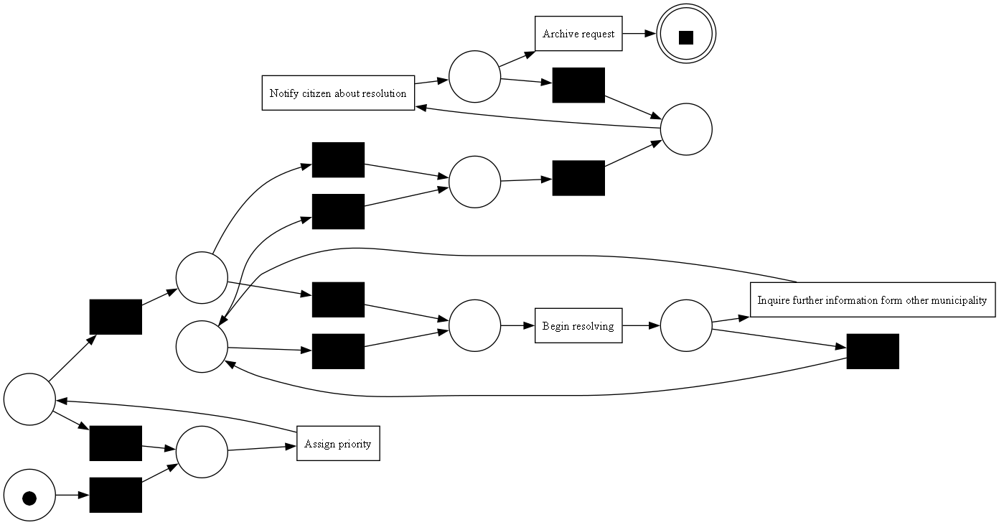

replaying log with TBR, completed variants ::   0%|          | 0/6 [00:00<?, ?it/s]

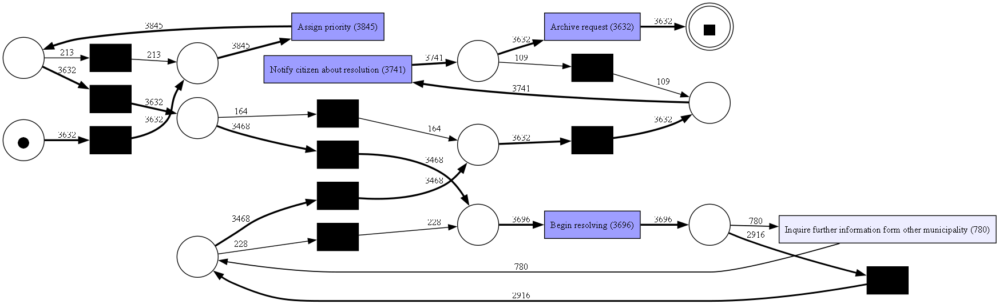

If we are looking for the results that have 2 “Notify citizen about resolution” activities in the same case, then there are 109 citizens informed twics about the resolution of their request.


In [329]:
# YOUR CODE HERE
net, im, fm = pm4py.discover_petri_net_inductive(log_archived_frequent)
pm4py.view_petri_net(petri_net=net, initial_marking=im, final_marking=fm) 

parameters = {pm4py.visualization.petri_net.visualizer.Variants.FREQUENCY.value.Parameters.FORMAT: "png"}
pn_fre = pm4py.visualization.petri_net.visualizer.apply(net, im, fm, parameters=parameters, variant=pm4py.visualization.petri_net.visualizer.Variants.FREQUENCY, log=log_archived_frequent)
pn_visualizer.view(pn_fre)
#count informed ==2
notify_df = log_archived_frequent[log_archived_frequent['concept:name'] == 'Notify citizen about resolution']
grouped = notify_df.groupby('case:concept:name').size()
citizens_with_two_notifications = grouped[grouped == 2].index.tolist()

#print(citizens_with_two_notifications)
print('If we are looking for the results that have 2 “Notify citizen about resolution” activities in the same case, then there are',
      len(citizens_with_two_notifications),'citizens informed twics about the resolution of their request.')

i) How often are citizens informed several times about the resolution of their request?

In [330]:
# YOUR CODE HERE
notify_df = log_archived_frequent[log_archived_frequent['concept:name'] == 'Notify citizen about resolution']
grouped = notify_df.groupby('case:concept:name').size()
citizens_with_two_notifications = grouped[grouped >= 2].index.tolist()
#print(citizens_with_two_notifications)
print('If we are looking for the results that have several “Notify citizen about resolution” activities in the same case, then there are',
      len(citizens_with_two_notifications),
      'citizens informed twics about the resolution of their request. The number is exactly the same as the number for informed-twice, which indicates that the citizen will be informed maximal 2 times.',
     'On the petri net showed above, we can also notice that there are 109 instances go though the activity “Notify citizen about resolution” again.')

If we are looking for the results that have several “Notify citizen about resolution” activities in the same case, then there are 109 citizens informed twics about the resolution of their request. The number is exactly the same as the number for informed-twice, which indicates that the citizen will be informed maximal 2 times. On the petri net showed above, we can also notice that there are 109 instances go though the activity “Notify citizen about resolution” again.


ii) In how many of these cases do you expect the citizens to receive the exact same letter twice? Explain your answer.
*Hint: Use the filtered log to answer this question*


__Student Answer:__ We expect the citizens to receive the exact the same letter twice of 109 cases. But when we checked the number of citizen IDs that have “Notify citizen about resolution” 2 twice and the number of citizen IDs that have several “Notify citizen about resolution” activities( see code below), we can discover that the former is less than 109 and the latter is larger than 109. This may show that the citizen may not receive the same letter twice as we expected. They raised more cases to know which letter contains the correct resolution.

In [331]:
notify_df = log_archived_frequent[log_archived_frequent['concept:name'] == 'Notify citizen about resolution']
grouped = notify_df.groupby('citizen_no').size()
citizens_with_two_notifications = grouped[grouped == 2].index.tolist()

print('There are ',len(citizens_with_two_notifications),'of citizen-IDs that have 2 “Notify citizen about resolution” activities.')


notify_df = log_archived_frequent[log_archived_frequent['concept:name'] == 'Notify citizen about resolution']
grouped = notify_df.groupby('citizen_no').size()
citizens_with_two_notifications = grouped[grouped >= 2].index.tolist()

print('There are ',len(citizens_with_two_notifications),'of citizen-IDs that have several “Notify citizen about resolution” activities.')

There are  38 of citizen-IDs that have 2 “Notify citizen about resolution” activities.
There are  283 of citizen-IDs that have several “Notify citizen about resolution” activities.


#### g)
Assess how well this model represents all traces in the log. Compute the token-based replay fitness on the event log `sa_log`. 
Store the log's fitness in a variable called `log_fitness` and display the value.

In [333]:
# YOUR CODE HERE
log_fitness_1 = pm4py.conformance.fitness_token_based_replay(log=sa_log, petri_net=net, initial_marking=im, final_marking=fm)
log_fitness = log_fitness_1['log_fitness']
print(log_fitness)


replaying log with TBR, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

0.9915235038701151


#### h)
Before being contempt with the achieved fitness, you want to consider how the fitness is distributed over the individual traces.

i. Create a histogram of the token-based replay fitness given the individual diagnostics of all traces and use the provided `bins`.
Save the diagnostics of the replay in a variable called `replayed_traces`.

replaying log with TBR, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

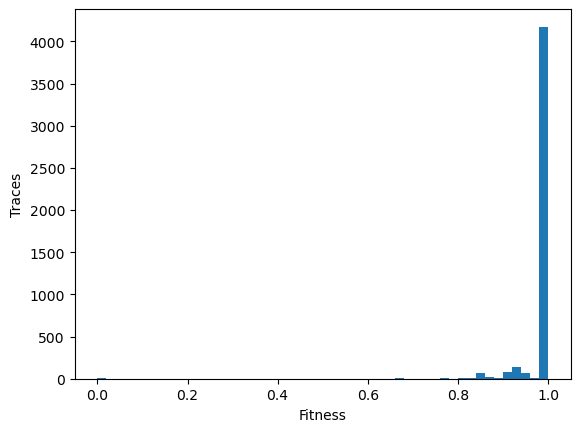

In [334]:
bins = np.arange(0, 1.02, 0.02)

# YOUR CODE HERE
replayed_traces =  pm4py.conformance_diagnostics_token_based_replay(log=sa_log, petri_net=net, initial_marking=im, final_marking=fm)
#display(replayed_traces)
trace_fitness = []
for x in replayed_traces:
    trace_fitness_ind = x['trace_fitness']
    trace_fitness.append(trace_fitness_ind)

#print(trace_fitness)
plt.hist(trace_fitness, bins=bins)
plt.xlabel('Fitness')
plt.ylabel('Traces')
plt.show()



ii. How high is the percentage of traces with full fitness? Save you answer in a variable called `percentage_traces_full_fitness`.

In [335]:
# YOUR CODE HERE
countf = 0
for value in trace_fitness:
    if value == 1:
        countf += 1
count_total = len(trace_fitness)
percentage_traces_full_fitness = countf / count_total
print('The percentage of traces with full fitness is:', percentage_traces_full_fitness)

The percentage of traces with full fitness is: 0.9115720524017468


#### i) (4 points) 
Processing speed is always an issue for municipalities. 
Compute the average throughput time in days of all variants in "log_archived_frequent" in a dictionary called `average_throughput`.
Each entry uses the variant as key and the average throughput time as value. 
Which trace variant is the fastest (store the entry describing this variant in a variable called `fastest_variant`)? 
Respectively, which is the slowest (store its entry in `slowest_variant`)?

In [336]:
# YOUR CODE HERE
def avg_time(log_freq: pd.DataFrame) -> dict:
    average_throughput = {}
    variants_all = pm4py.get_variants(log_freq)
    vkeys = list(variants_all.keys())
    for x in range(len(variant_all)):
        variant_ = pm4py.filter_variants(log_freq, [vkeys[x]])
        duration_ = pm4py.get_all_case_durations(variant_, activity_key='concept:name', case_id_key='case:concept:name', timestamp_key='time:timestamp')
        duration_ = [x/3600/24 for x in duration_]
        durations_ = []
        for value in duration_:
            value = round(value,2)
            durations_.append(value)
        avg_time_ = np.mean(durations_)
        average_throughput.update({vkeys[x]:avg_time_})
    return average_throughput
average_throughput = avg_time(log_archived_frequent)
max_min = list(average_throughput.values())
fast_time = min(max_min)
slowest_time = max(max_min)

def get_key (dict, value):
    return [ k for k, v in dict.items() if v == value]
    
fastest_variant = get_key(average_throughput, fast_time)
slowest_variant = get_key(average_throughput, slowest_time)

display(average_throughput)
display()
print('Fastest_variant is:',fastest_variant)
print('Slowest_variant is:',slowest_variant)

{('Assign priority',
  'Begin resolving',
  'Notify citizen about resolution',
  'Archive request'): 40.513710904480135,
 ('Assign priority',
  'Assign priority',
  'Begin resolving',
  'Notify citizen about resolution',
  'Archive request'): 40.86323943661972,
 ('Assign priority',
  'Begin resolving',
  'Inquire further information form other municipality',
  'Notify citizen about resolution',
  'Archive request'): 41.00076086956521,
 ('Assign priority',
  'Notify citizen about resolution',
  'Archive request'): 39.26932926829269,
 ('Assign priority',
  'Begin resolving',
  'Inquire further information form other municipality',
  'Begin resolving',
  'Notify citizen about resolution',
  'Archive request'): 42.38697368421052,
 ('Assign priority',
  'Begin resolving',
  'Notify citizen about resolution',
  'Notify citizen about resolution',
  'Archive request'): 38.493853211009174}

Fastest_variant is: [('Assign priority', 'Begin resolving', 'Notify citizen about resolution', 'Notify citizen about resolution', 'Archive request')]
Slowest_variant is: [('Assign priority', 'Begin resolving', 'Inquire further information form other municipality', 'Begin resolving', 'Notify citizen about resolution', 'Archive request')]
